In [36]:
import geopy.distance
import pandas as pd
import numpy as np
from geopy.geocoders import Nominatim
import pickle
import uuid
from sqlalchemy import Engine
import requests

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import DBSCAN

from sklearn.metrics import explained_variance_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

from homeharvest import scrape_property
from datetime import datetime, timedelta
from azure.storage.blob import BlobServiceClient, BlobBlock

# from config import config
# from database.utils import (
#     read_historical_property_data,
#     write_historical_property_data,
#     remove_location_from_db,
#     add_model_score,
# )


def scrape_historical_sales(location: str, city: str, state: str):
#     sql_df = read_historical_property_data(engine, city, state)
    sql_df = []

    if len(sql_df) == 0:
        latest_ts = None
    else:
        sql_df["last_sold_date"] = pd.to_datetime(
            sql_df["last_sold_date"], errors="coerce"
        )
        latest_ts = sql_df["last_sold_date"].max()

    date_format = "%Y-%m-%d"
    increment = timedelta(days=90)

    if latest_ts is None:
        start_date = datetime(year=2015, month=1, day=1)
    else:
#         remove_location_from_db(
#             engine=engine, city=city, state=state, last_sold_date=latest_ts
#         )
        start_date = latest_ts
    end_date = start_date + increment

    dataframes = []

    while start_date < datetime.utcnow():
        start_date_str = start_date.strftime(date_format)
        end_date_str = end_date.strftime(date_format)

        try:
            properties = scrape_property(
                location=location,
                listing_type="sold",
                date_from=start_date_str,
                date_to=end_date_str,
            )
            print(f"Start:{start_date_str} End:{end_date_str} Count:{len(properties)}")
            dataframes.append(properties)

        except ValueError as e:
            print(f"Start:{start_date_str} End:{end_date_str} Error:{str(e)}")

        start_date = end_date + timedelta(days=1)
        end_date += increment

    scraped_df = pd.concat(dataframes, ignore_index=True)

    scraped_df["style"] = scraped_df["style"].apply(lambda x: x.value if x else None)
    scraped_df.replace([np.inf, -np.inf, np.nan], None, inplace=True)
    scraped_df.drop(
        ["mls", "mls_id", "primary_photo", "alt_photos"], axis=1, inplace=True
    )

    print(scraped_df.info())
#     write_historical_property_data(engine, scraped_df)

    combined_df = (
        pd.concat([scraped_df, sql_df], ignore_index=True)
        if len(sql_df) > 0
        else scraped_df
    )
    return combined_df


class PropertyDatasetProcessor:
    def __init__(self, df, city, is_training=True, planned_mortgage_rate=None):
        self.dataset = df
        self.city = city
        self.is_training = is_training
        self.planned_mortgage_rate = planned_mortgage_rate

        geolocator = Nominatim(user_agent="RealEstateAdvisor")
        location = geolocator.geocode(f"Downtown {city}")
        self.downtown_lat, self.downtown_lon = location.latitude, location.longitude

    @staticmethod
    def calc_baths_num(full_baths, half_baths):
        if pd.isna(full_baths) and pd.isna(half_baths):
            return 0.0
        elif pd.isna(full_baths):
            return half_baths * 0.5
        elif pd.isna(half_baths):
            return full_baths
        else:
            return full_baths + 0.5 * half_baths

    @staticmethod
    def calc_lat_lon_dist(lat1, lon1, lat2, lon2):
        if pd.isna(lat1) or pd.isna(lon1) or pd.isna(lat2) or pd.isna(lon2):
            return None
        return round(geopy.distance.geodesic((lat1, lon1), (lat2, lon2)).km, 1)

    @staticmethod
    def fetch_mortgage_rates(series_id="MORTGAGE30US"):
        url = f"https://api.stlouisfed.org/fred/series/observations"
        params = {
            "api_key": "d8dcefb8a2e7e77823eebd400f84ec42",
            "file_type": "json",
            "series_id": series_id,
        }
        response = requests.get(url, params=params)
        data = response.json()
        df = pd.DataFrame(data["observations"])
        df["date"] = pd.to_datetime(df["date"])
        return df[["date", "value"]]

    @staticmethod
    def filter_iqr(df, column):
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        return df[(df[column] >= Q1 - 1.5 * IQR) & (df[column] <= Q3 + 1.5 * IQR)]

    def clean_dataset(self):
        final_df: pd.DataFrame = self.dataset[(self.dataset.city == self.city)].copy()

        # Handling NULL values
        final_df["baths"] = final_df.apply(
            lambda row: self.calc_baths_num(row["full_baths"], row["half_baths"]),
            axis=1,
        )
        final_df["lot_sqft"] = final_df.apply(
            lambda row: 0.0 if pd.isna(row["lot_sqft"]) else row["lot_sqft"], axis=1
        )
        final_df["parking_garage"] = final_df.apply(
            lambda row: (
                0.0 if pd.isna(row["parking_garage"]) else row["parking_garage"]
            ),
            axis=1,
        )

        final_df.dropna(
            subset=[
                "zip_code",
                "beds",
                "sqft",
                "year_built",
                "sold_price",
                "lot_sqft",
                "parking_garage",
                "last_sold_date",
                "baths",
                "latitude",
                "longitude",
            ],
            inplace=True,
        )

        # FEATURE ENGINEERING

        # Adding mortgate rate
        final_df["last_sold_date"] = pd.to_datetime(final_df["last_sold_date"])
        final_df["sold_year"] = final_df["last_sold_date"].dt.year

        mortgage_rates = self.fetch_mortgage_rates()

        if self.is_training:
            mortgage_rates = mortgage_rates.sort_values(by="date")
            final_df = final_df.sort_values(by="last_sold_date")

            final_df = pd.merge_asof(
                final_df,
                mortgage_rates,
                left_on="last_sold_date",
                right_on="date",
                direction="backward",
            )
            final_df.rename(columns={"value": "mortgage_rate"}, inplace=True)
            final_df.drop(["date"], axis=1, inplace=True)
        else:
            if self.planned_mortgage_rate:
                final_df["mortgage_rate"] = self.planned_mortgage_rate
            else:
                latest_mortgage_date = mortgage_rates[
                    mortgage_rates["date"] == mortgage_rates["date"].max()
                ]
                latest_mortgage_rate = latest_mortgage_date["value"].iloc[0]
                final_df["mortgage_rate"] = latest_mortgage_rate

        # Adding age
        final_df["age"] = final_df.apply(
            lambda row: row["sold_year"] - row["year_built"], axis=1
        )
        final_df = final_df[final_df.age >= 0]

        # Adding distance to downtown
        final_df["distance_to_downtown"] = final_df.apply(
            lambda row: self.calc_lat_lon_dist(
                row["latitude"], row["longitude"], self.downtown_lat, self.downtown_lon
            ),
            axis=1,
        )

        # Filtering out outliers
        for col in ("sqft", "year_built", "distance_to_downtown"):
            final_df = self.filter_iqr(final_df, col)

        if self.is_training:
            dbscan = DBSCAN(eps=0.5, min_samples=10)
            final_df["cluster_label"] = dbscan.fit_predict(final_df[["sold_price"]])
            final_df = final_df[final_df["cluster_label"] != -1]
            final_df.drop(columns=["cluster_label"], inplace=True)

        return final_df


# def get_chunk_blocks(data, blob_client, chunk_size=4 * 1024 * 1024):
#     block_list = []

#     index = 0
#     while index < len(data):
#         chunk_data = data[index : index + chunk_size]

#         if not chunk_data:
#             break
#         blk_id = str(uuid.uuid4())
#         blob_client.stage_block(block_id=blk_id, data=chunk_data)
#         block_list.append(BlobBlock(block_id=blk_id))

#         index += chunk_size

#     return block_list


# def write_model_to_storage(
#     engine: Engine, model, city: str, state: str, model_score: float
# ):
#     serialized_model = pickle.dumps(model)

#     blob_service_client = BlobServiceClient.from_connection_string(
#         config.az_storage_conn_str
#     )
#     blob_name = f"{city.lower()}_{state.lower()}.pkl"
#     blob_client = blob_service_client.get_blob_client(
#         container=config.az_storage_container_name, blob=blob_name
#     )

#     block_list = get_chunk_blocks(
#         serialized_model, blob_client, chunk_size=4 * 1024 * 1024
#     )
#     blob_client.commit_block_list(block_list)
#     add_model_score(engine=engine, model_name=blob_name, score=model_score)
#     print(f"{blob_name} uploaded successfully.")


In [9]:
city, state = "Seattle", "WA"
location = f"{city}, {state}"

df = scrape_historical_sales(
    location=location, city=city, state=state
)

Start:2015-01-01 End:2015-04-01 Count:1304
Start:2015-04-02 End:2015-06-30 Count:2325
Start:2015-07-01 End:2015-09-28 Count:2249
Start:2015-09-29 End:2015-12-27 Count:1831
Start:2015-12-28 End:2016-03-26 Count:1349
Start:2016-03-27 End:2016-06-24 Count:2504
Start:2016-06-25 End:2016-09-22 Count:2529
Start:2016-09-23 End:2016-12-21 Count:2129
Start:2016-12-22 End:2017-03-21 Count:1555
Start:2017-03-22 End:2017-06-19 Count:2379
Start:2017-06-20 End:2017-09-17 Count:2519
Start:2017-09-18 End:2017-12-16 Count:2435
Start:2017-12-17 End:2018-03-16 Count:1635
Start:2018-03-17 End:2018-06-14 Count:2367
Start:2018-06-15 End:2018-09-12 Count:2374
Start:2018-09-13 End:2018-12-11 Count:1971
Start:2018-12-12 End:2019-03-11 Count:1548
Start:2019-03-12 End:2019-06-09 Error:'INDUSTRIAL' is not a valid PropertyType
Start:2019-06-10 End:2019-09-07 Count:2760
Start:2019-09-08 End:2019-12-06 Count:2484
Start:2019-12-07 End:2020-03-05 Count:2018
Start:2020-03-06 End:2020-06-03 Count:2276
Start:2020-06-04 E

In [37]:
dataset = PropertyDatasetProcessor(df, city).clean_dataset()
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 68842 entries, 0 to 83861
Data columns (total 30 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   property_url          68842 non-null  object        
 1   status                68842 non-null  object        
 2   style                 68825 non-null  object        
 3   street                68842 non-null  object        
 4   unit                  22361 non-null  object        
 5   city                  68842 non-null  object        
 6   state                 68842 non-null  object        
 7   zip_code              68842 non-null  object        
 8   beds                  68842 non-null  object        
 9   full_baths            67398 non-null  object        
 10  half_baths            18489 non-null  object        
 11  sqft                  68842 non-null  object        
 12  year_built            68842 non-null  object        
 13  days_on_mls          

In [38]:
# cols_to_drop = [
#     "sold_price",
#     "property_url",
#     "status",
#     "style",
#     "street",
#     "unit",
#     "city",
#     "state",
#     "full_baths",
#     "half_baths",
#     "days_on_mls",
#     "list_price",
#     "list_date",
#     "last_sold_date",
#     "price_per_sqft",
#     "latitude",
#     "longitude",
#     "stories",
#     "hoa_fee",
# ]

corr_cols = [
#     "sold_price",
    "zip_code",
    "beds",
    "baths",
    "sqft",
    "year_built",
#     "days_on_mls",
    "lot_sqft",
#     "stories",
#     "hoa_fee",
    "parking_garage",
    "sold_year",
    "mortgage_rate",
    "age",
    "distance_to_downtown"
]

# X = dataset.drop(cols_to_drop, axis=1)
X = dataset[corr_cols]
y = dataset["sold_price"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

rf_model = RandomForestRegressor(n_estimators=50, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions on the test set
y_pred = rf_model.predict(X_test)

# Calculate metrics
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
expl_rf = explained_variance_score(y_pred, y_test)

print(f"R-squared: {r2:.2f}")
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Mean Squared Error: {mse:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"Explained Variance Score: {expl_rf:.2f}")

R-squared: 0.80
Mean Absolute Error: 111432.89
Mean Squared Error: 33494070267.05
Root Mean Squared Error: 183013.85
Explained Variance Score: 0.75


C:\Users\roman.bilets\Desktop\diploma\Repos\real-estate-scraper\.venv\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [39]:
print("""
R-squared: 0.89
Mean Absolute Error: 82567.77
Mean Squared Error: 11294070267.05
Root Mean Squared Error: 96013.31
Explained Variance Score: 0.82
""")


R-squared: 0.89
Mean Absolute Error: 82567.77
Mean Squared Error: 11294070267.05
Root Mean Squared Error: 96013.31
Explained Variance Score: 0.82



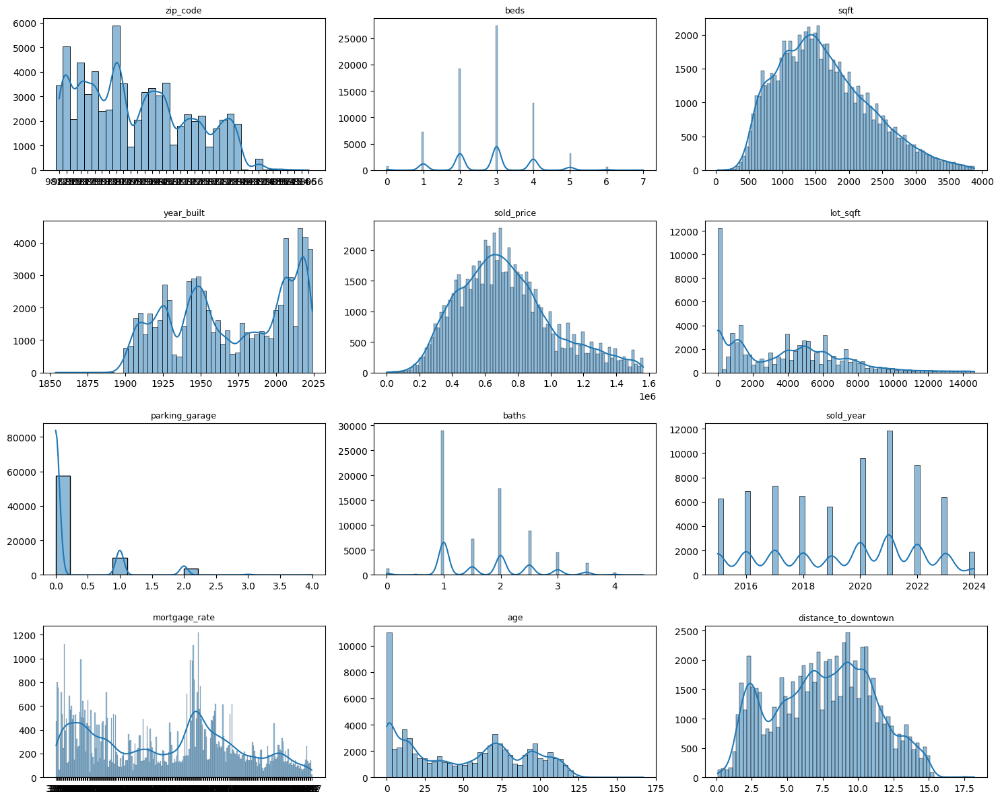

In [393]:
# Setting up the subplot grid
num_columns = visual_df.shape[1]  # Get the number of columns in the DataFrame
num_rows = num_columns // 3 + (num_columns % 3 > 0)  # Arrange in rows of 3
fig, axes = plt.subplots(num_rows, 3, figsize=(15, num_rows * 3))  # Adjust the size accordingly
axes = axes.flatten()

# Plotting each variable on its own subplot
for i, col in enumerate(visual_df.columns):
    sns.histplot(visual_df[col], ax=axes[i], kde=True, bins='auto')  # Use distplot if using an older version of seaborn
    axes[i].set_title(col, fontsize=9)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

# Hide any unused subplots
for ax in axes[num_columns:]:
    ax.set_visible(False)

# Tidy up the layout
plt.tight_layout()
plt.show()


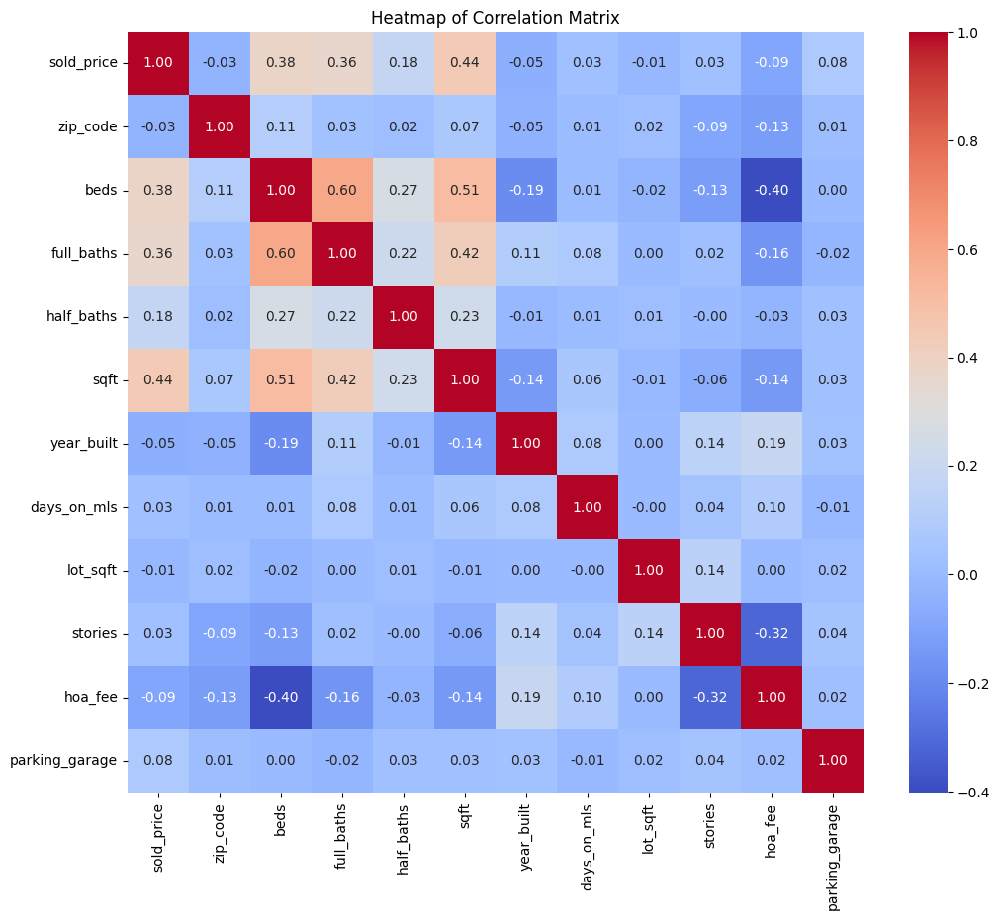

In [18]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


correlation_matrix = dataset[corr_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Heatmap of Correlation Matrix')
plt.show()

In [305]:
differences = y_test - y_pred

import pandas as pd

# Ensure y_test and differences are in proper format, might need to reset index if y_test is a Series
results_df = pd.DataFrame({
    "S/N": range(1, len(y_test) + 1),
    "Actual Value": y_test.values,  # Use y_test.values to extract values if y_test is a Series
    "Predicted Value": y_pred,
    "Difference": differences
})

# Reset index of y_test if it comes from a DataFrame with a specific index
y_test = y_test.reset_index(drop=True)

def highlight_diffs(val):
    color = 'red' if val < 0 else 'green'
    return f'color: {color}'

# Assuming y_test and y_pred have already been defined and used to create results_df
results_df['Absolute Difference'] = abs(results_df['Difference'])
sorted_df = results_df.sort_values(by='Absolute Difference')

def highlight_diffs(val):
    color = 'red' if val < 0 else 'green'
    return f'color: {color}'

# Apply the styling
styled_df = sorted_df.style.applymap(highlight_diffs, subset=['Difference'])
styled_df


C:\Users\roman.bilets\AppData\Local\Temp\ipykernel_4028\2479411586.py:29: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styled_df = sorted_df.style.applymap(highlight_diffs, subset=['Difference'])


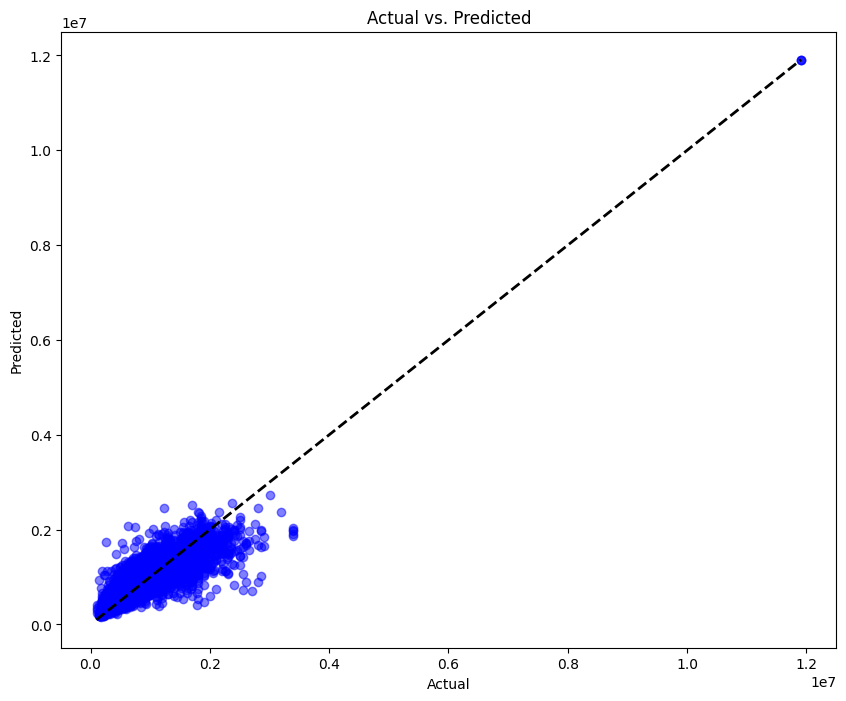

In [41]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.scatter(y_test, y_pred, alpha=0.5, color='blue')  # Plotting actual vs predicted values
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Line of identity
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs. Predicted')
plt.show()


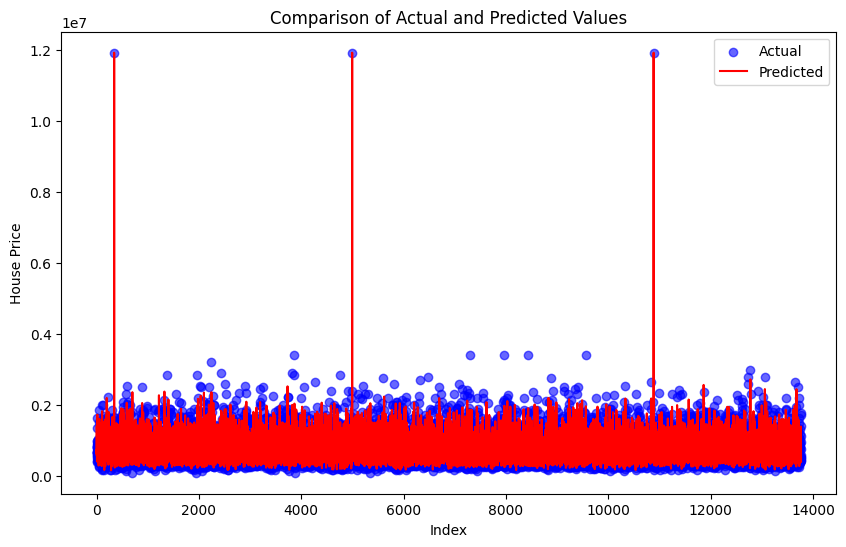

In [43]:
import pandas as pd

# Assuming X_test contains an index or can be associated with a meaningful order
results_df = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_pred
})

# Reset index to help in plotting, if necessary
results_df.reset_index(drop=True, inplace=True)


import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(range(len(results_df)), results_df['Actual'], color='blue', label='Actual', alpha=0.6)
plt.plot(range(len(results_df)), results_df['Predicted'], color='red', label='Predicted')
plt.title('Comparison of Actual and Predicted Values')
plt.xlabel('Index')
plt.ylabel('House Price')
plt.legend()
plt.show()

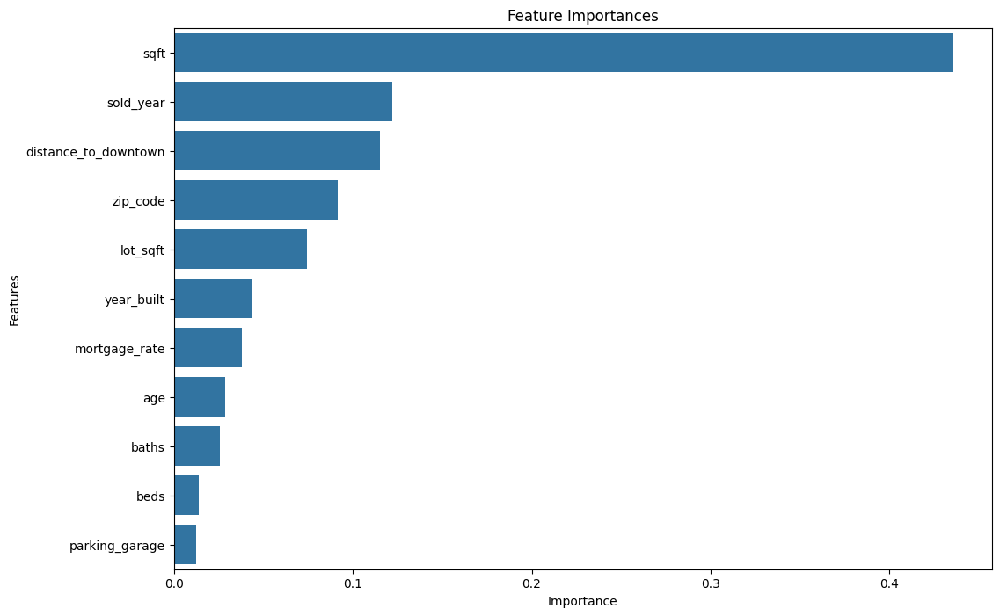

In [44]:
# Visualizing feature importances

importances = rf_model.feature_importances_

feature_names = X_train.columns
features_importance = sorted(zip(feature_names, importances), key=lambda x: x[1], reverse=True)

import matplotlib.pyplot as plt
import seaborn as sns

# Create a DataFrame for easier plotting
importances_df = pd.DataFrame(features_importance, columns=['Feature', 'Importance'])

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x="Importance", y="Feature", data=importances_df)
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()


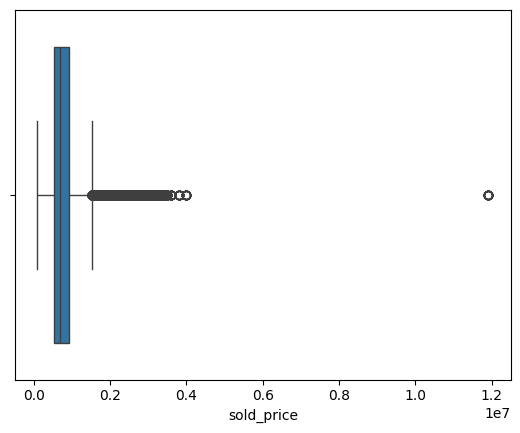

In [289]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(x=final_df['sold_price'])
plt.show()